<a href="https://colab.research.google.com/github/aniruddhbansal2000/semantic_segmentation_Unet/blob/main/Cityscape_Unet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np                  # handles arrays and matrices operations
import os                           # directories and data
import matplotlib.pyplot as plot    # plotting curve
from PIL import Image               # import images
import cv2                          # openCV, image display and overlap
from sklearn.cluster import KMeans  # apply K-means
import random                       # random selections
from skimage import io              # image display

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Conv2D, MaxPooling2D, Dense, Dropout, LeakyReLU, UpSampling2D, concatenate, ReLU
from tensorflow.keras.optimizers import Adam, SGD
from keras.metrics import MeanIoU
from keras.callbacks import ModelCheckpoint

In [ ]:
import os
os.chdir('drive/My Drive/Projects/Cityscape Semantic Segmentation')

In [ ]:
# from google.colab.patches import cv2_imshow

# load images from directory
def LoadImage(name, path="cityscapes_data/cityscapes_data/train"):

    img = Image.open(path + "/" + name)
    img = np.array(img)
    
    # extracting segmented part
    seg = img[:, 256:]
    # extracting image part
    img = img[:, 0:256]

    # removing car bonut in image
    seg = seg[:192, :]
    img = img[:192, :]
    
    img = np.array(img)
    seg = np.array(seg)
    return img/255, seg/255

## CLASSIFYING COLOR SPACE using CLUSTERING

Dataset has image with corresponding segmented mask

*   Object classes - Need to derive from pixel color
*   However pixel values for even same object are different 
*   This is possibly due to change in pixel values image compression and conversion to current jpg form

Assigning classes
1.   Manually assigning color centers and mapping pixel to nearest center - tedious and not consistent with pixel groups
2.   Use k-Means clustering for grouping image pixel into classes



# KMeans Clustering

*   Randomly select 400 images from training set 
*   Add points in 3D space (correponding to pixel - GBR format with value 0.0 to 1.0)

*   Perform clustering, K = 14.
*   On observing segmented masks - saw 14-15 colors to represent different objects and map pixels to classes


> Blue - Locomotive (car/bike)

> Red - People

> Pink - Pavement

> Yellow - Light/Sign board

> Green - Trees/bushes

> Light green - Grass

> Greenish blue - Bus/train

> Violet - Road

> Black - Car bonnet / traffic sign / pole

> Gray - Buildings

> Sky blue - Sky

> Purple - Sodewalk

> Peach - Parking area

> Brown - shops



















In [ ]:
# Classify pixel colors into distinct classes and apply segmentation

from random import sample

train_size = 2975

# randomly selecting 300Gaussian Mixture Model images from training set to apply clustering (all pixels from these images) and select 14 color classes
sequence = [i for i in range(train_size)]
#select 300 random training images
subset = sample(sequence, 300)

files = os.listdir("cityscapes_data/cityscapes_data/train")

colors = []
for i in subset:
    img, seg = LoadImage(files[i])
    # print("%d " %(i))
    colors.append(seg.reshape(seg.shape[0]*seg.shape[1], 3))

colors = np.array(colors)
# colors contains all pixels represented as points in 3D plane - coordinates are GBR(0 to 1 each)
colors = colors.reshape((colors.shape[0]*colors.shape[1],3))

#Run K-means clustering
km = KMeans(14).fit(colors)

In [ ]:
colorSet = set()
# Creating set which contains pixel values for all the chosen images for color_class_determination
for i in subset:
    img, seg = LoadImage(files[i])
    seg = seg.reshape(seg.shape[0]*seg.shape[1], 3)
    # print(seg.shape)
    for i in range(seg.shape[0]):
      # print(seg[i])
      colorSet.add(tuple(seg[i]))


In [ ]:
 # give values of color centers obtained in K-means
center_colors = km.cluster_centers_
# for K-means had scaled value down by 255, revert back (factor along each dimension 255, no change with clustering)
center_colors = center_colors * 255
center_colors = center_colors.astype(int)

# display color centeres in RGB color format
print(center_colors)

[[127  62 127]
 [ 69  70  68]
 [193 155 156]
 [106 140  36]
 [  3   3 136]
 [241  36 229]
 [ 77 125 172]
 [  7   9  13]
 [204  25  60]
 [ 88   7  68]
 [214 205  33]
 [158 245 155]
 [122 127  95]
 [200  59 188]]


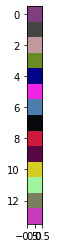

In [ ]:
# TO DISPLAY - OBTAINED COLORS AFTER APPLYING K-MEANS CLUSTERING

n = len(center_colors)

x = np.zeros((n,1,3))
for k in range(n): 
  x[k][0][0] = center_colors[k][0]
  x[k][0][1] = center_colors[k][1]
  x[k][0][2] = center_colors[k][2]

plot.imshow(x / 255)

In [ ]:
# have segment (result image mask after segmentation)
# convert it into categorical format

def ColorsToClass(seg):
    s = seg.reshape((seg.shape[0]*seg.shape[1],3))
    s = km.predict(s)
    s = s.reshape((seg.shape[0], seg.shape[1]))
    
    # number of color centers
    n = len(center_colors)
    
    cls = np.zeros((seg.shape[0], seg.shape[1], n))
    
    for i in range(n):
        m = np.copy(s)
        m[m!=i] = -1   #all not class i - mark -1
        m[m!=-1] = 1   #left (class i) - mark 1
        m[m==-1] = 0   #mark again to 0 (non class i)
        
        # marking for class i for segment's pixels
        cls[:,:,i] = m
        
    return cls


In [ ]:
# Build image showing classified pixels - to visualize resultant after preprocessing
def LayersToRGBImage(img):
    
    nimg = np.zeros((img.shape[0], img.shape[1], 3))  # length, breadth and RGB
    
    # img.shape[2] - No of classes
    
    for i in range(img.shape[2]):
        c = img[:,:,i]               # image array, class i? 1: Yes, 0:No (those pixels in class i - have 1 marked against them)
        # col = colors[i]
        col = center_colors[i]       # corresponding RGB color for class i
        
        for j in range(3):            # each in RGB
            nimg[:,:,j] += col[j]*c   # add class i's color value for corresponding pixels (having c[length_pos][width_pos] = 1)

    nimg = nimg/255.0
    return nimg

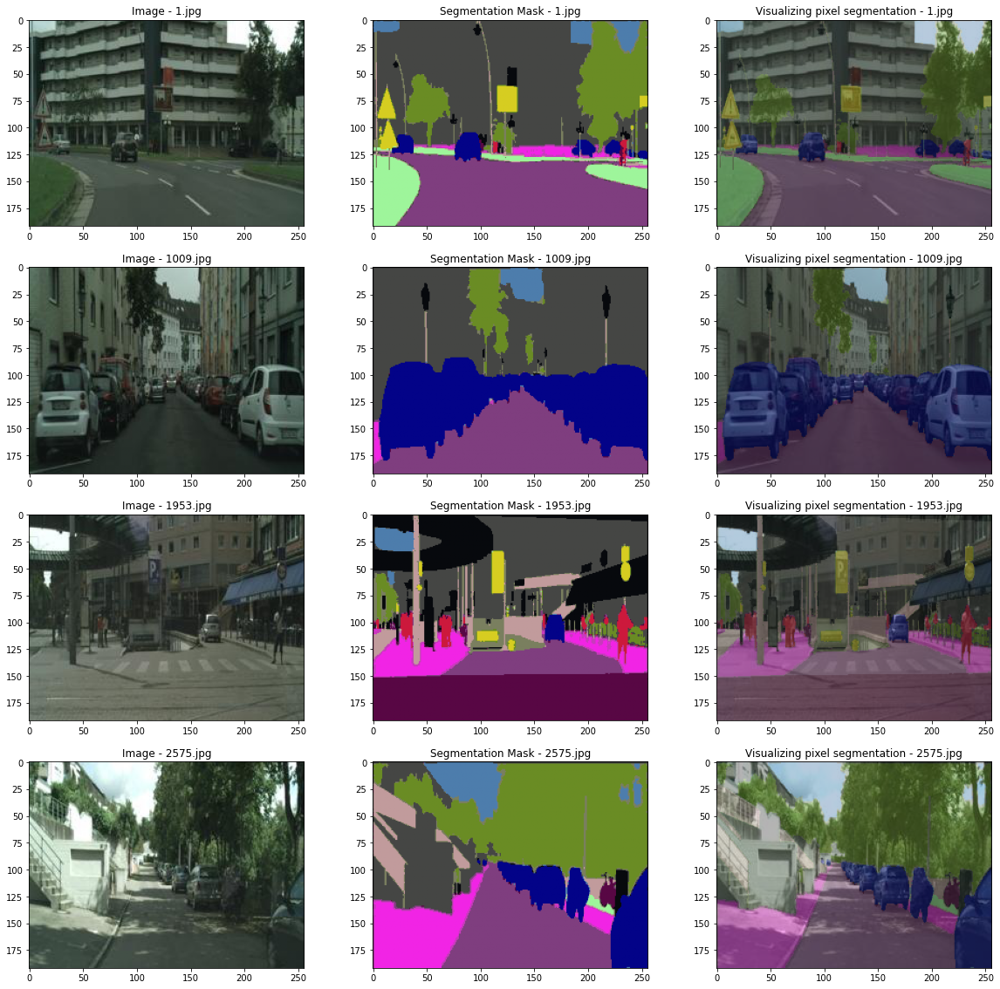

In [ ]:
# Test image after preprocessing
def show_image(name):
  img, seg = LoadImage(name)
  seg2 = ColorsToClass(seg)
  seg2 = LayersToRGBImage(seg2)
  total = cv2.addWeighted(img, .6, seg2, 0.4, 0)
  
  return img, seg2, total


plot.figure(figsize = (20,20))
names = ["1.jpg", "1009.jpg", "1953.jpg", "2575.jpg"]
for i in range(len(names)):

  img, seg, total = show_image(names[i])
  
  plot.subplot(len(names), 3, i*3 + 1)
  plot.title("Image - "  + names[i])
  plot.imshow(img)

  plot.subplot(len(names), 3, i*3 + 2)
  plot.title("Segmentation Mask - " + names[i])
  plot.imshow(seg)

  plot.subplot(len(names), 3, i*3 + 3)
  plot.title("Visualizing pixel segmentation - " + names[i])
  plot.imshow(total)
plot.show()

In [ ]:
# generate images, segments for training and validating data
def Generate(path="cityscapes_data/cityscapes_data/train", batch_size = 16):
    
    # images in training set
    files = os.listdir(path)
    while True:

    # generators which add image when iterated over file (train images)
      imgs=[]
      segs=[]
      
      # iterables
      for i in range(batch_size):
          file = random.sample(files,1)[0]
          
          # flip=False
          # if random.random() > 0.5:
          #     flip=True
          
          # angle = maxangle*(random.random()*2-1)
          
          img, seg = LoadImage(file, path)
          
          seg = ColorsToClass(seg)
          
          imgs.append(img)
          segs.append(seg)
      # return generator    
      yield np.array(imgs), np.array(segs)


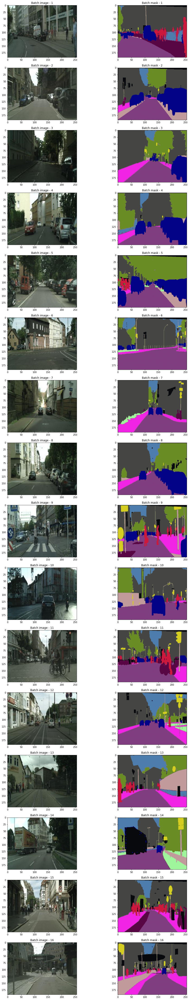

In [ ]:
# generator function (default generate batch for TRAINING SET)
gen = Generate()
# generate a next random batch (after one previously generated)
imgs, segs = next(gen)

# print(imgs.shape)

n = len(imgs)

plot.figure(figsize = (16, 80))   # column by row space demarcated
for i in range(n):
  plot.subplot(n, 2, i*2 + 1)
  plot.title("Batch image - %d" %(i+1))
  plot.imshow(imgs[i])

  plot.subplot(n, 2, i*2 + 2)
  plot.title("Batch mask - %d" %(i+1))
  plot.imshow(LayersToRGBImage(segs[i]))
plot.show()

In [ ]:
# BUILDING U-Net components

# encoder block (for downsampling using ConvBlocks and pooling)
def encoder(inp, channels, kernel_size, batch_norm = True, dropout = 0.5):
  x = Conv2D(channels, kernel_size, padding = "same")(inp)
  x = BatchNormalization()(x) if batch_norm else x
  x = ReLU()(x) 

  x = Dropout(dropout)(x) if dropout > 0. else x
  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = ReLU()(x) 
  
  p = MaxPooling2D()(x)                           # Maxpooling - halving block size (channels same)

  return p, x 

# decoder block (for upsampling using Transpose convolution blocks)
def decoder(inp, channels, kernel_size, skip_conv, batch_norm = True, dropout = 0.5):
  x = UpSampling2D()(inp)                         # Upsample (inverse mapping of MaxPooling)
  x = concatenate([x, skip_conv])

  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = BatchNormalization()(x) if batch_norm else x
  x = ReLU()(x)
  
  x = Dropout(dropout)(x) if dropout > 0. else x
  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = ReLU()(x) 
  
  return x

# bottle neck (bottom most component - WHEN channels highest and object dimension lowest)
def bottle_neck(inp, channels, kernel_size, batch_norm = True, dropout = 0.5):
  x = Conv2D(channels, kernel_size, padding = "same")(inp)
  x = ReLU()(x) 
  x = BatchNormalization()(x) if batch_norm else x
  
  x = Dropout(dropout)(x) if dropout > 0. else x
  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = ReLU()(x) 
  
  return x

In [ ]:
# BUILDING MODEL using above blocks
x = Input(shape=(192, 256, 3))  # length X Width X colors(channels)

# down-sampling 
p1, x1 = encoder(x, 64, 3)
p2, x2 = encoder(p1, 128, 3)
p3, x3 = encoder(p2, 256, 3)

# bottleneck
x4 = bottle_neck(p3, 512, 3)

# up-sampling
u5 = decoder(x4, 256, 3, x3)
u6 = decoder(u5, 128, 3, x2)
u7 = decoder(u6, 64, 3, x1)

# softmax layer
x8 = Conv2D(len(center_colors), 1, activation="softmax")(u7)


model = Model(x, x8)

In [ ]:
def jaccard_distance(y_true, y_pred, smooth=100):
    intersection = tf.reduce_sum(tf.abs(y_true * y_pred), axis=-1)
    sum_ = tf.reduce_sum(tf.abs(y_true) + tf.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * smooth

In [ ]:
opt = Adam(lr=0.0005)
mean_iou = MeanIoU(num_classes=14)

model.compile(optimizer=opt,
             loss=jaccard_distance,
             metrics= mean_iou)

model.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 192, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_134 (Conv2D)            (None, 192, 256, 64  1792        ['input_10[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_63 (BatchN  (None, 192, 256, 64  256        ['conv2d_134[0][0]']             
 ormalization)                  )                                                           

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                                                  
 dropout_66 (Dropout)           (None, 24, 32, 512)  0           ['batch_normalization_66[0][0]'] 
                                                                                                  
 conv2d_141 (Conv2D)            (None, 24, 32, 512)  2359808     ['dropout_66[0][0]']             
                                                                                                  
 re_lu_133 (ReLU)               (None, 24, 32, 512)  0           ['conv2d_141[0][0]']             
                                                                                                  
 up_sampling2d_26 (UpSampling2D  (None, 48, 64, 512)  0          ['re_lu_133[0][0]']              
 )                                                                                                
                                                                                                  
 concatena

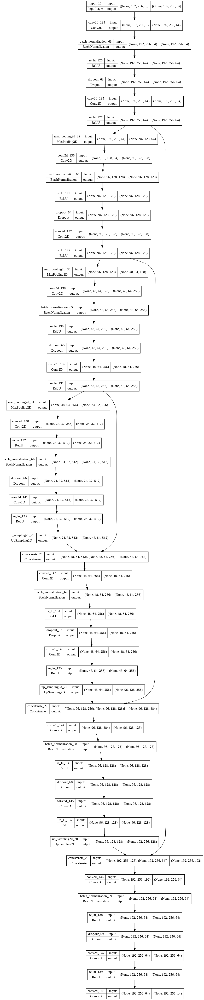

In [ ]:
# Vizualizing the U-net model
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
train_gen = Generate()
val_gen = Generate("cityscapes_data/cityscapes_data/val")

In [ ]:
clb = [ModelCheckpoint("best_result.h5", save_best_only=True, verbose=0)]

h = model.fit(train_gen, epochs = 20, steps_per_epoch = 2975/16, validation_steps = 500/16, validation_data=val_gen, custom_objects = jaccard_distance, callbacks = clb)

Epoch 1/20
185/185 [==============================] - 136s 722ms/step - loss: 0.8400 - mean_io_u_7: 0.4680 - val_loss: 1.5064 - val_mean_io_u_7: 0.4643
Epoch 2/20
185/185 [==============================] - 136s 734ms/step - loss: 0.7421 - mean_io_u_7: 0.4797 - val_loss: 1.2697 - val_mean_io_u_7: 0.4643
Epoch 3/20
185/185 [==============================] - 136s 731ms/step - loss: 0.7155 - mean_io_u_7: 0.5059 - val_loss: 1.0369 - val_mean_io_u_7: 0.6218
Epoch 4/20
185/185 [==============================] - 136s 731ms/step - loss: 0.6340 - mean_io_u_7: 0.5677 - val_loss: 0.9111 - val_mean_io_u_7: 0.5201
Epoch 5/20
185/185 [==============================] - 126s 676ms/step - loss: 0.5982 - mean_io_u_7: 0.6127 - val_loss: 0.6416 - val_mean_io_u_7: 0.6328
Epoch 6/20
185/185 [==============================] - 124s 669ms/step - loss: 0.5919 - mean_io_u_7: 0.6484 - val_loss: 0.6675 - val_mean_io_u_7: 0.6663
Epoch 7/20
185/185 [==============================] - 135s 728ms/step - loss: 0.5855 - m

In [ ]:
# save model
model.save("model.h5")
# load weights giving best results
# model = load_model("best_result.h5")


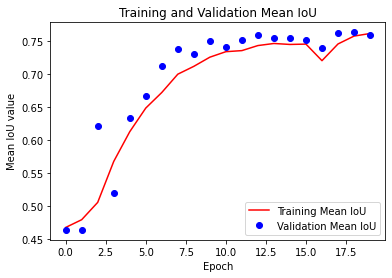

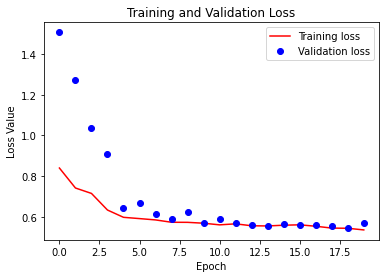

In [ ]:
mean_iou = h.history['mean_io_u_7']
val_mean_iou = h.history['val_mean_io_u_7']

loss = h.history['loss']
val_loss = h.history['val_loss']

# epochs = h.history['epochs']

plot.plot(mean_iou, 'r', label='Training Mean IoU')
plot.plot(val_mean_iou, 'bo', label='Validation Mean IoU')
plot.title('Training and Validation Mean IoU')
plot.xlabel('Epoch')
plot.ylabel('Mean IoU value')
# plot.ylim([0, 1])
plot.legend()

plot.figure()
plot.plot(loss, 'r', label='Training loss')
plot.plot(val_loss, 'bo', label='Validation loss')
plot.title('Training and Validation Loss')
plot.xlabel('Epoch')
plot.ylabel('Loss Value')
# plot.ylim([0, 1])
plot.legend()
plot.show()

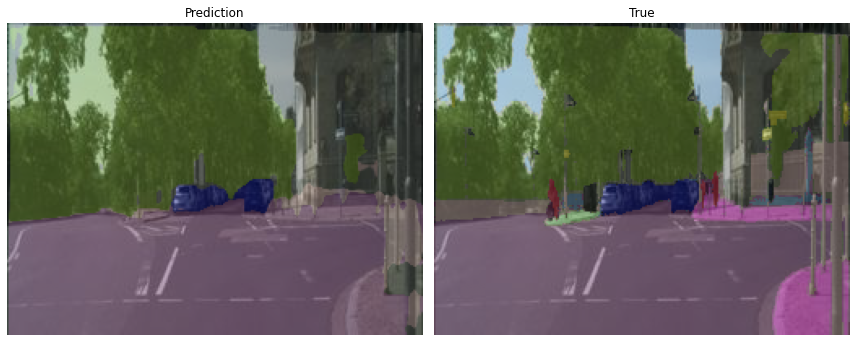

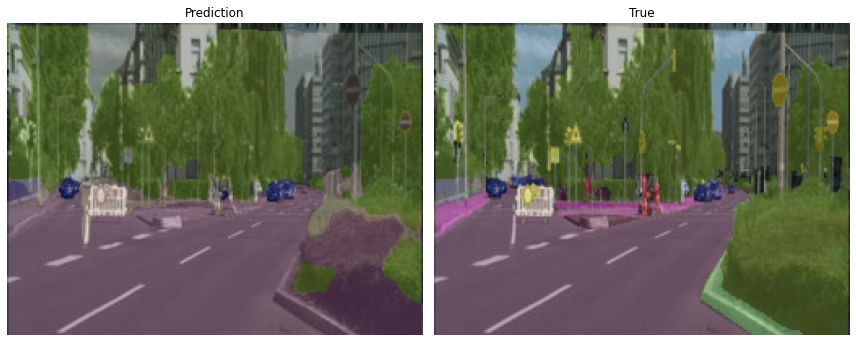

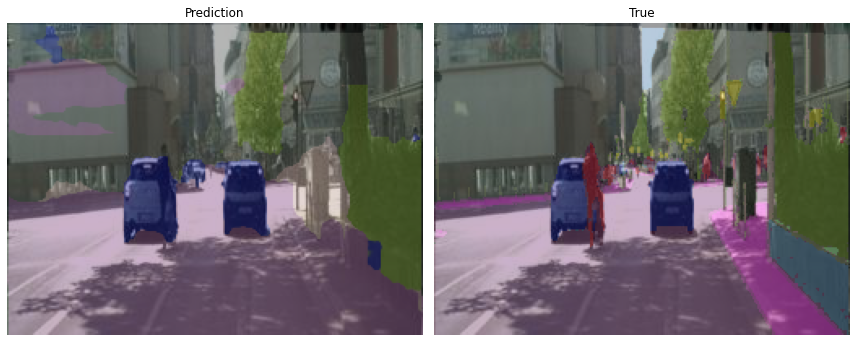

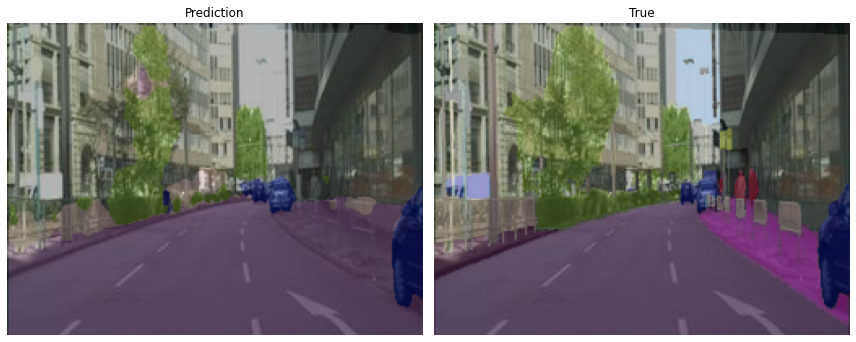

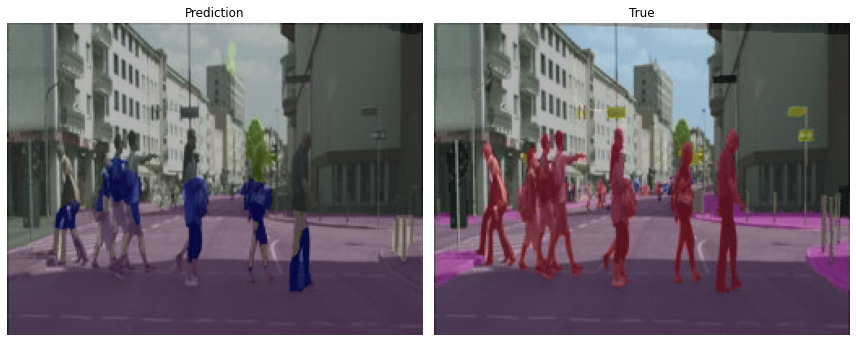

...

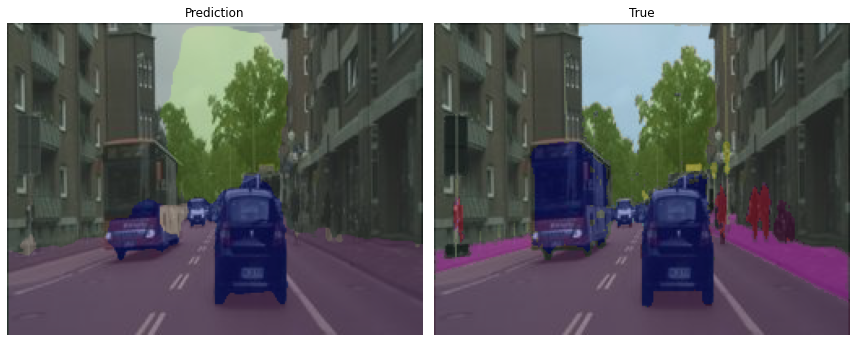

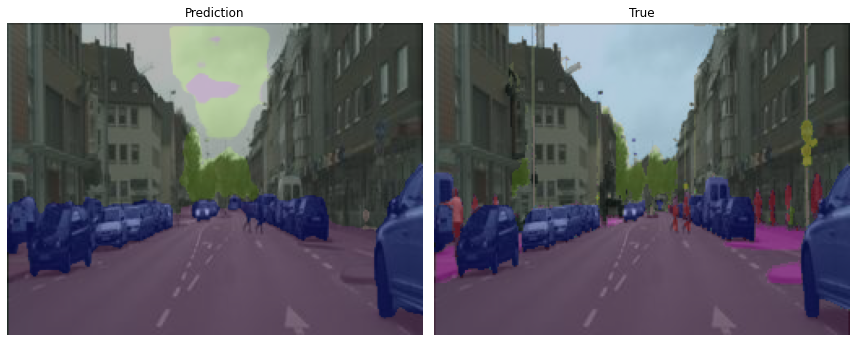

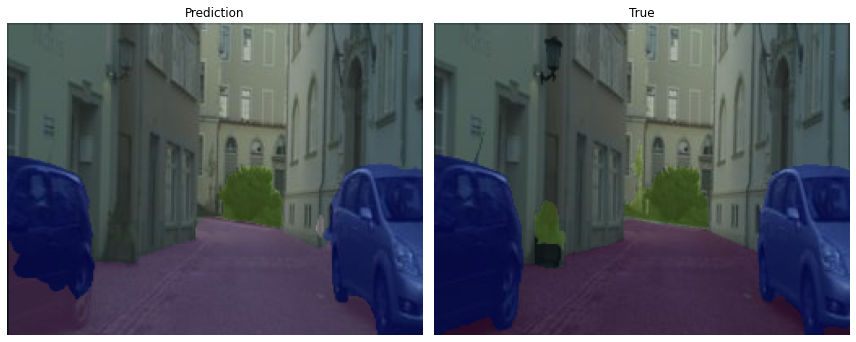

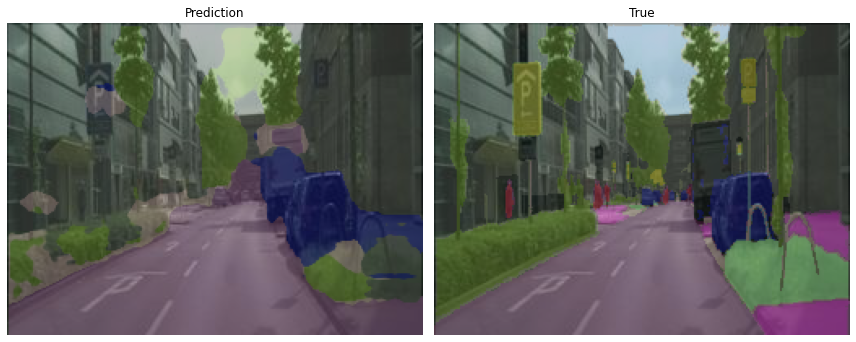

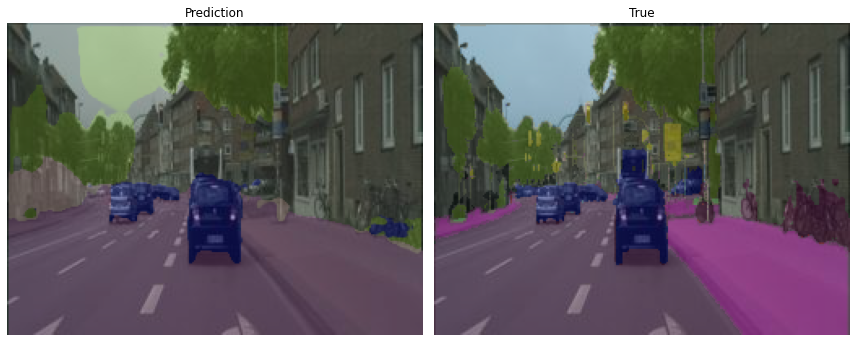

In [ ]:
# generate test case to check prediction
test_gen = Generate("cityscapes_data/cityscapes_data/val")
max_show = 20
for imgs, segs in test_gen:
    p = model.predict(imgs)   #model prediction
    for i in range(p.shape[0]):
        if i > max_show:
            break
        _p = LayersToRGBImage(p[i])
        _s = LayersToRGBImage(segs[i])
        
        predimg = cv2.addWeighted(imgs[i], 0.6, _p, 0.4, 0)
        trueimg = cv2.addWeighted(imgs[i], 0.6, _s, 0.4, 0)
        plot.figure(figsize=(12,6))
        plot.subplot(121)
        plot.title("Prediction")
        plot.imshow(predimg)
        plot.axis("off")
        plot.subplot(122)
        plot.title("True")
        plot.imshow(trueimg)
        plot.axis("off")
        plot.tight_layout()
        plot.savefig("pred_"+str(i)+".png", dpi=150)
        plot.show()
    break

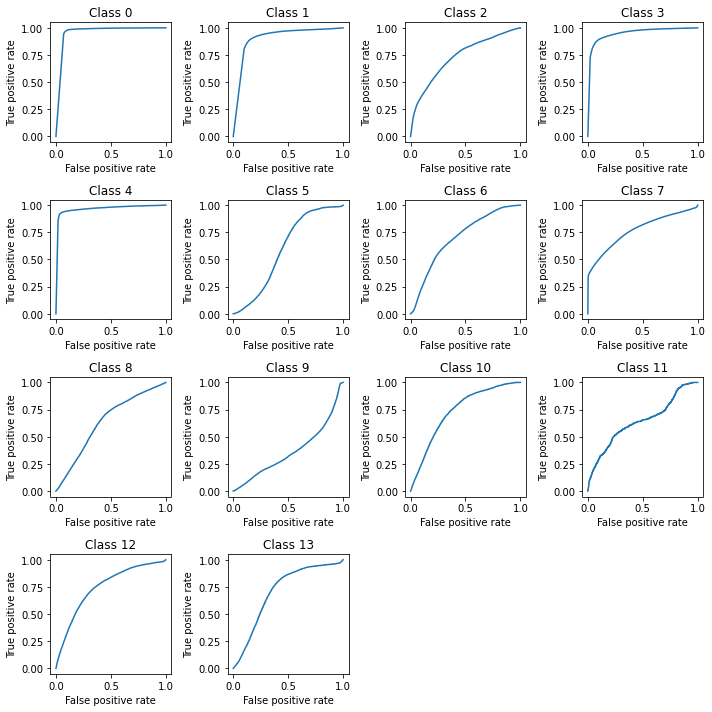

In [ ]:
# Evaluation metrics
from sklearn.metrics import roc_curve, balanced_accuracy_score
test_gen = Generate("cityscapes_data/cityscapes_data/val", batch_size=16)
max_show = 20

bass = []

for imgs, segs in test_gen:
    p = model.predict(imgs)
    
    plot.figure(figsize=(10, 10))
    for i in range(p.shape[-1]):
        fpr, tpr, _ = roc_curve(segs[:,:,:,i].ravel(), p[:,:,:,i].ravel())
        
        _p = np.round(p[:,:,:,i].ravel()).astype(np.int32)
        bas = balanced_accuracy_score(segs[:,:,:,i].ravel(), _p)
        
        bass.append(bas)
        
        plot.subplot(4,4,i+1)
        plot.plot(fpr, tpr)
        plot.title("Class "+str(i))
        plot.xlabel("False positive rate")
        plot.ylabel("True positive rate")
    
    plot.tight_layout()
    plot.show()
    
    break

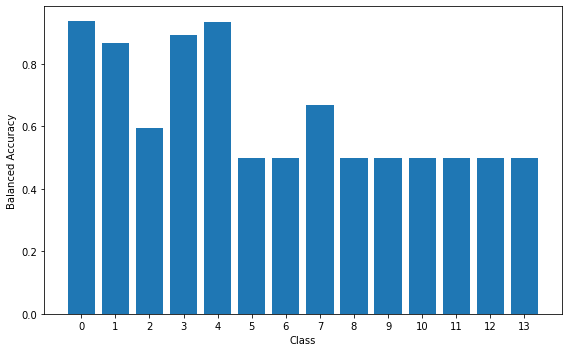

In [ ]:
plot.figure(figsize=(8, 5))
plot.bar(np.arange(0, len(bass)), bass)
plot.xticks(np.arange(0, len(bass)))
plot.ylabel("Balanced Accuracy")
plot.xlabel("Class")
plot.tight_layout()
plot.savefig("bas.png")
plot.show()